In [43]:
import numpy as np
import random
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from numpy import sort
from pandas import set_option
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.impute import SimpleImputer
from matplotlib.cbook import boxplot_stats
from imblearn.over_sampling import SMOTE, RandomOverSampler, BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler
from mlxtend.plotting import plot_confusion_matrix
from collections import Counter
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF
from sklearn.feature_selection import VarianceThreshold, SelectFromModel
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score, fbeta_score, make_scorer, recall_score  
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_validate, cross_val_score, KFold, StratifiedKFold, RepeatedKFold, LeaveOneOut

from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier 
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

In [34]:
df = pd.read_csv('measures_v2.csv')

In [29]:
df.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


In [30]:
df['profile_id'] = df['profile_id'].astype('category')

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
u_q,1330816.0,54.279005,44.173234,-25.290930,12.069925,48.938181,90.034393,133.036994
coolant,1330816.0,36.229995,21.786149,10.623751,18.698135,26.900141,49.857487,101.598512
stator_winding,1330816.0,66.342745,28.672061,18.585815,42.787957,65.110129,88.141137,141.362885
u_d,1330816.0,-25.133809,63.091972,-131.530411,-78.690904,-7.429755,1.470271,131.469788
stator_tooth,1330816.0,56.878582,22.952233,18.133976,38.416012,56.036345,75.586682,111.946423
motor_speed,1330816.0,2202.080728,1859.663350,-275.549144,317.110665,1999.976685,3760.639058,6000.015137
i_d,1330816.0,-68.716810,64.933233,-278.003632,-115.406060,-51.093763,-2.979688,0.051897
i_q,1330816.0,37.412782,92.181880,-293.426793,1.095863,15.774007,100.612150,301.707855
pm,1330816.0,58.506776,19.001498,20.856956,43.151582,60.266287,72.008371,113.606628
stator_yoke,1330816.0,48.187965,19.991004,18.076689,31.990333,45.625509,61.460828,101.147964


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1330816 entries, 0 to 1330815
Data columns (total 13 columns):
 #   Column          Non-Null Count    Dtype   
---  ------          --------------    -----   
 0   u_q             1330816 non-null  float64 
 1   coolant         1330816 non-null  float64 
 2   stator_winding  1330816 non-null  float64 
 3   u_d             1330816 non-null  float64 
 4   stator_tooth    1330816 non-null  float64 
 5   motor_speed     1330816 non-null  float64 
 6   i_d             1330816 non-null  float64 
 7   i_q             1330816 non-null  float64 
 8   pm              1330816 non-null  float64 
 9   stator_yoke     1330816 non-null  float64 
 10  ambient         1330816 non-null  float64 
 11  torque          1330816 non-null  float64 
 12  profile_id      1330816 non-null  category
dtypes: category(1), float64(12)
memory usage: 123.1 MB


In [7]:
df.isna().sum()

u_q               0
coolant           0
stator_winding    0
u_d               0
stator_tooth      0
motor_speed       0
i_d               0
i_q               0
pm                0
stator_yoke       0
ambient           0
torque            0
profile_id        0
dtype: int64

In [8]:
len(df.columns)

13

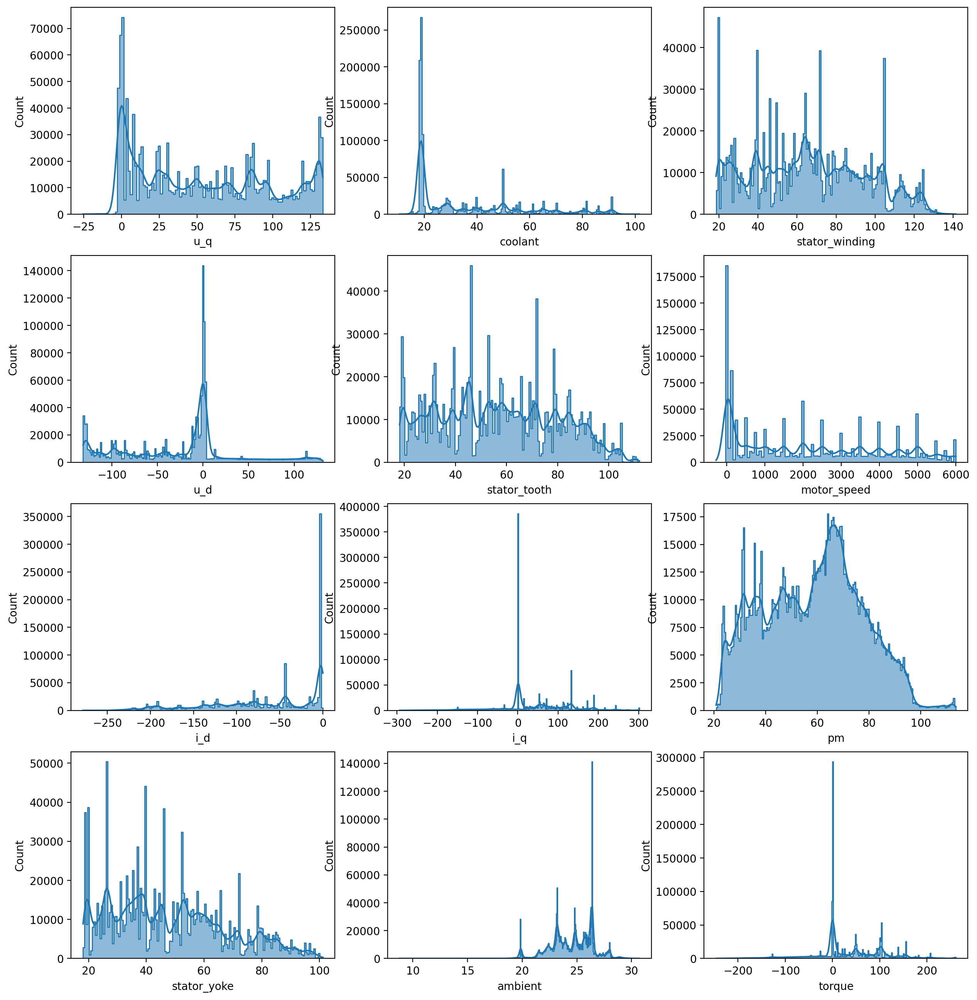

In [9]:
cols = df.columns

n_cols = 3
n_rows = np.around(len(df.columns)/n_cols,0).astype(int)

fig,axes = plt.subplots(n_rows,n_cols, sharey=False, figsize=(5*n_cols,4*n_rows), dpi=200)


for ax,col in zip(axes.flatten(),cols):
    sns.histplot(df[col], kde=True, element='step', discrete=False, ax=ax)

In [10]:
p_counts = df.groupby('profile_id')['pm'].agg('count')
p_counts

profile_id
2     19357
3     19248
4     33424
5     14788
6     40388
      ...  
76    22188
78     8445
79    31154
80    23824
81    17672
Name: pm, Length: 69, dtype: int64

In [11]:
time = pd.DataFrame(data=df['profile_id'].value_counts()/(2*3600))
time.rename(columns={'profile_id':'time_hrs'},inplace=True)

In [12]:
time

,time_hrs
20,6.107083
6,5.609444
65,5.568611
18,5.240556
66,5.066111
...,...
51,0.869583
64,0.868056
52,0.517500
46,0.302778


<AxesSubplot:ylabel='time_hrs'>

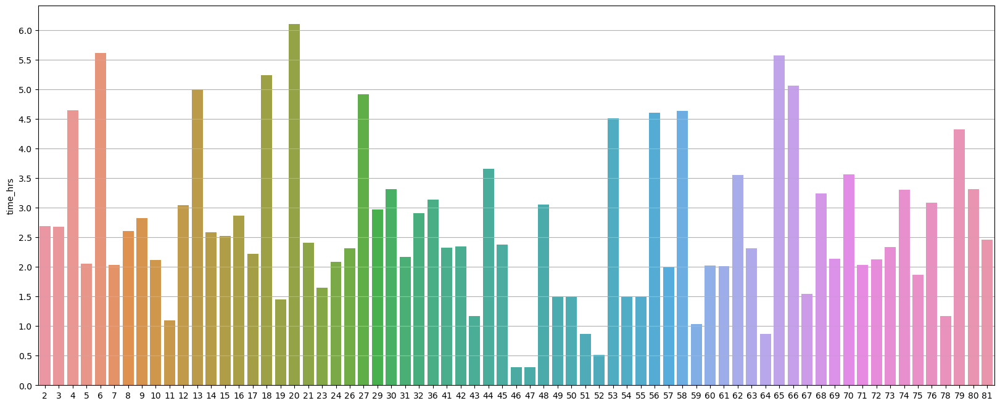

In [13]:
plt.figure(figsize=(20,8))
plt.yticks(np.arange(0,7,0.5))
plt.grid(visible=True)
sns.barplot(y=time['time_hrs'],x=time.index, )

<AxesSubplot:xlabel='time_hrs', ylabel='Count'>

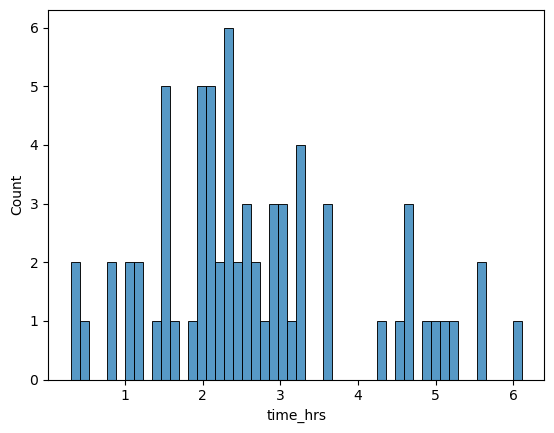

In [14]:
sns.histplot(time['time_hrs'],bins=50)

In [15]:
time['time_hrs'].median()

2.3808333333333334

<AxesSubplot:>

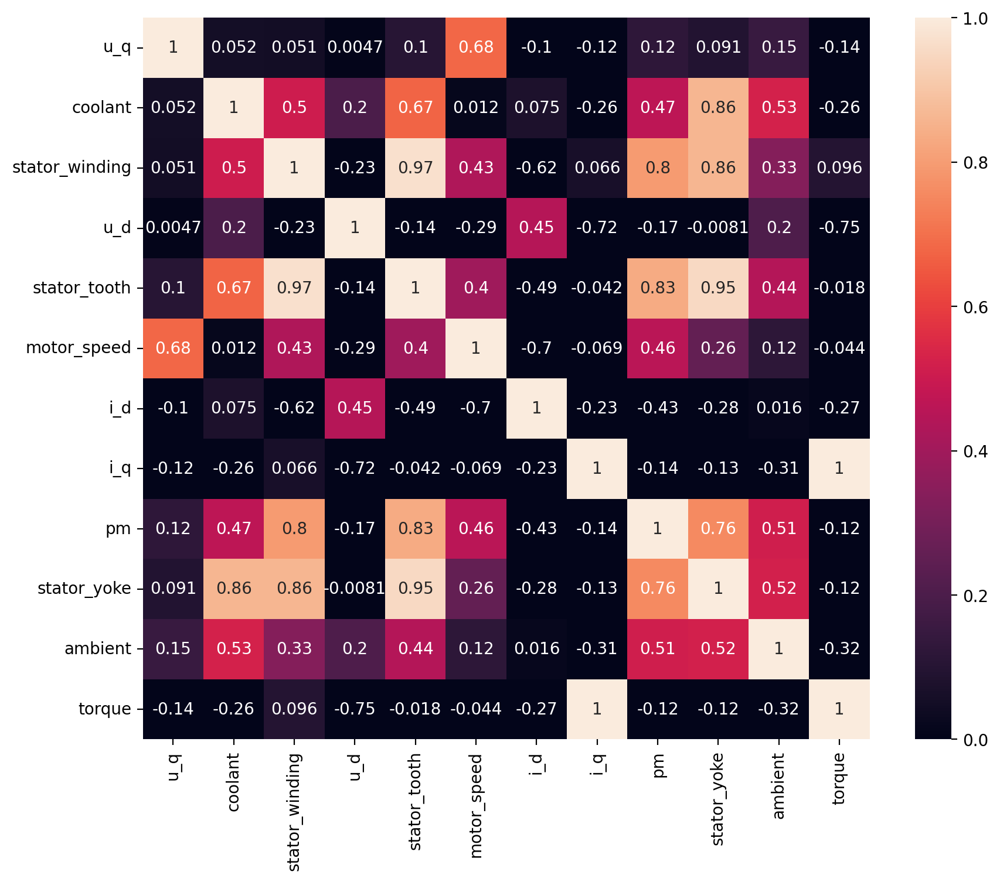

In [16]:
df_corr = df.corr()
plt.figure(figsize=(10,8),dpi=200)
sns.heatmap(df_corr,annot=True,vmax=1,vmin=0)

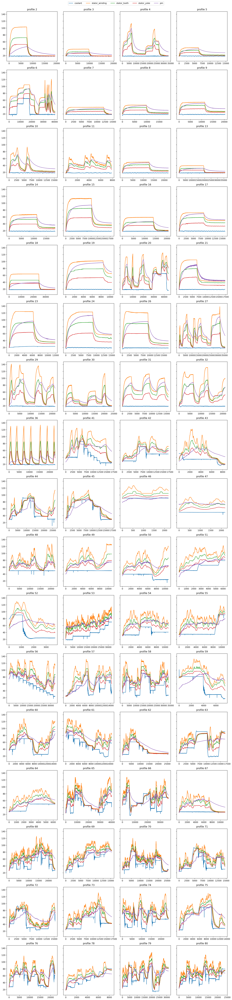

In [35]:
profile_dict = {profile_id : df for profile_id, df in df.groupby('profile_id')}

n_cols = 4
n_rows = np.around(len(profile_dict)/n_cols,0).astype(int)

fig,axes = plt.subplots(n_rows, n_cols, sharey=True, figsize=(4*n_cols,4*n_rows), dpi=200)

for i,(ax,(profile_id,df)) in enumerate(zip(axes.flatten(),profile_dict.items())):
    for col in ['coolant','stator_winding','stator_tooth','stator_yoke','pm']:
        ax.plot(df[col].reset_index(drop=True), label=col)
    ax.set_title(f'profile {profile_id}')

fig.tight_layout()
ax.legend(ncol=15, loc='lower center', bbox_to_anchor=(.5, 1), bbox_transform=fig.transFigure)

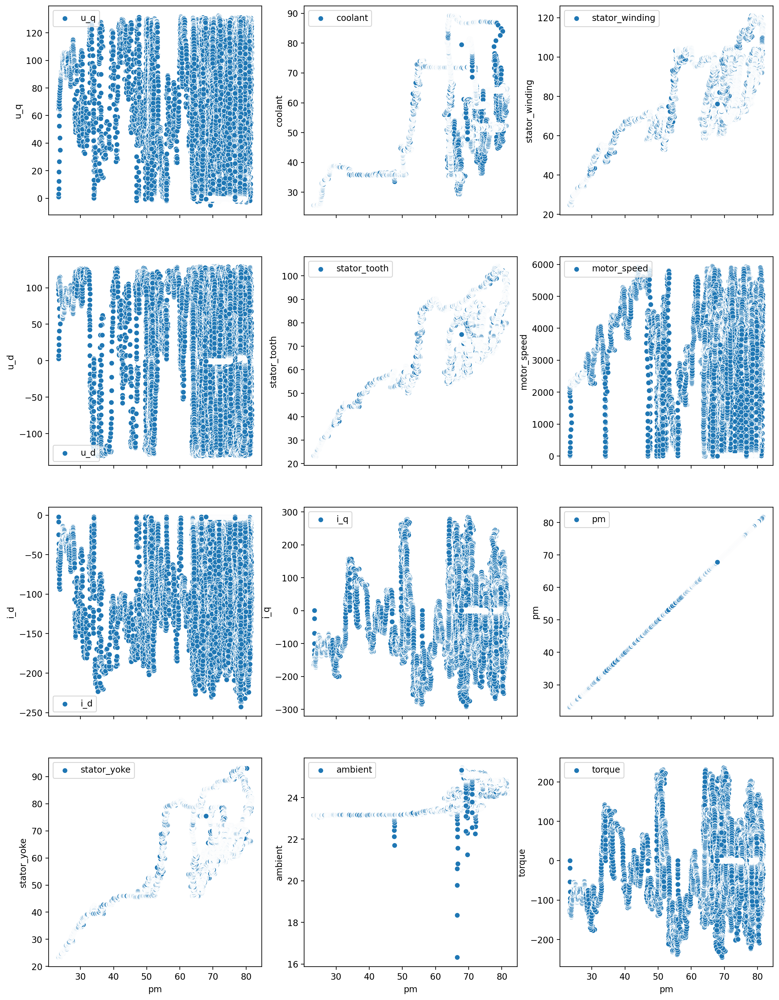

In [66]:
n_cols = 3
n_rows = np.around(len(df.columns)/n_cols,0).astype(int)

fig,axes = plt.subplots(n_rows, n_cols, sharex=True, figsize=(5*n_cols,5*n_rows), dpi=200)

for (ax,col) in zip(axes.flatten(),df.columns):
    sns.scatterplot(y = df[col], x=df['pm'], label=col, ax=ax)

Split data into train and test sets

In [36]:
df_shuffled = df.sample(frac=1.0)

In [37]:
df_shuffled = df.drop('profile_id',axis=1)

In [39]:
X = df_shuffled[['u_q','coolant','stator_winding','u_d','stator_tooth','motor_speed','i_d','i_q','stator_yoke','ambient','torque']]
y = df_shuffled['pm']

In [40]:
(X_train, X_test,y_train,y_test) = train_test_split(X,y,test_size=0.3)

In [41]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

0.25477946880794466


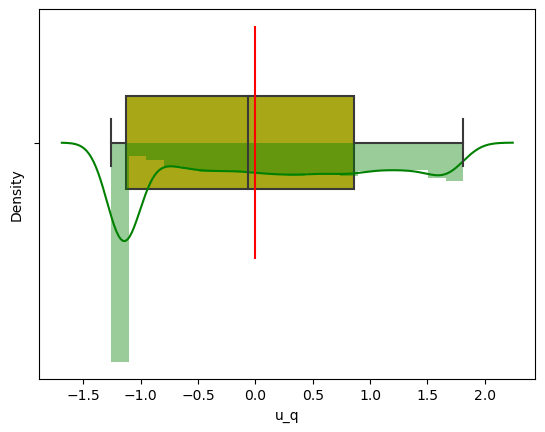

0.6518402457675804


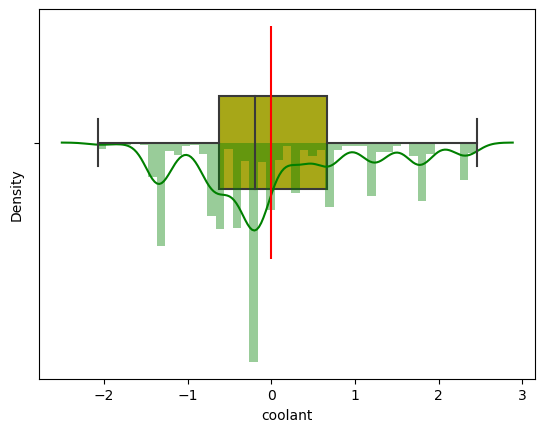

0.18606150003554164


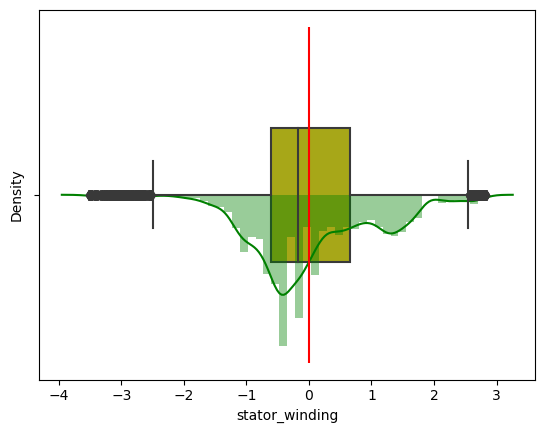

-0.07971441955072919


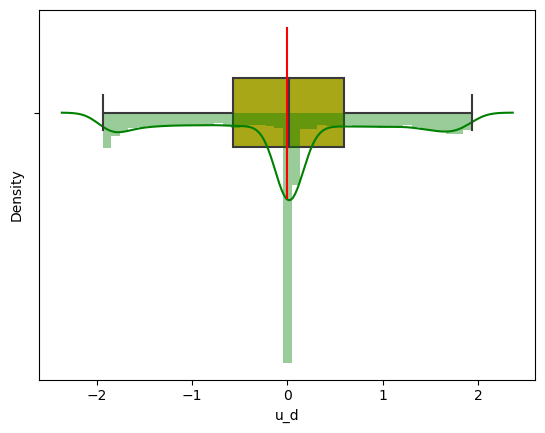

-0.0004527461140070639


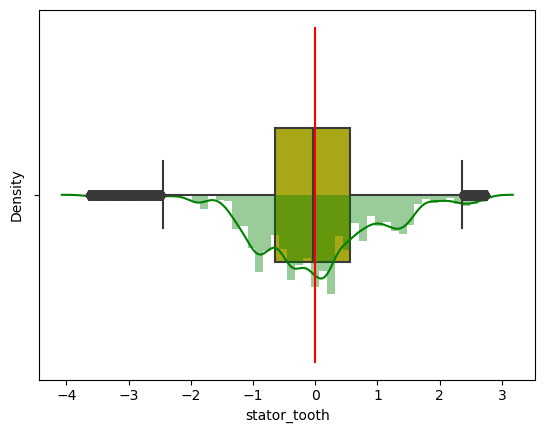

0.3109812545469349


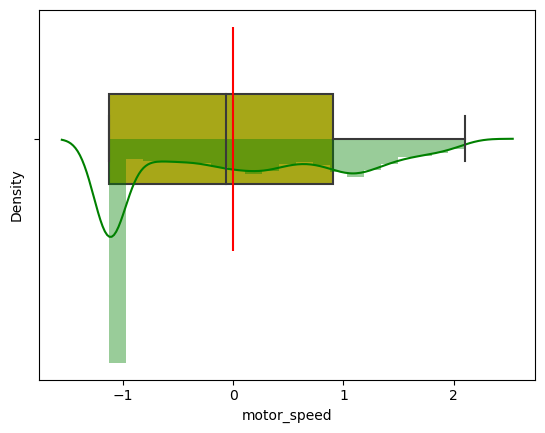

-0.6236584427970828


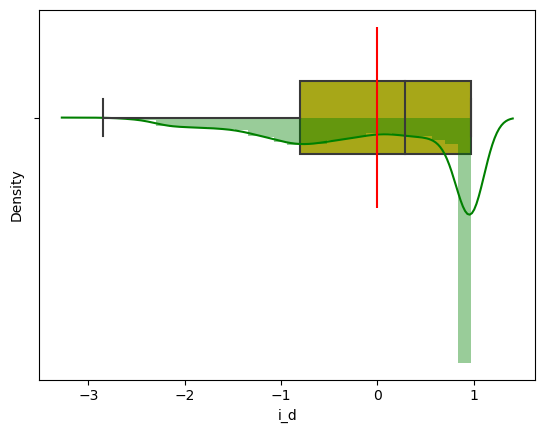

0.10191132192367235


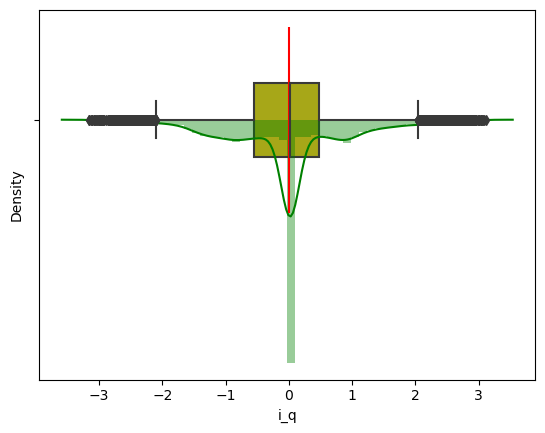

0.0315336855829374


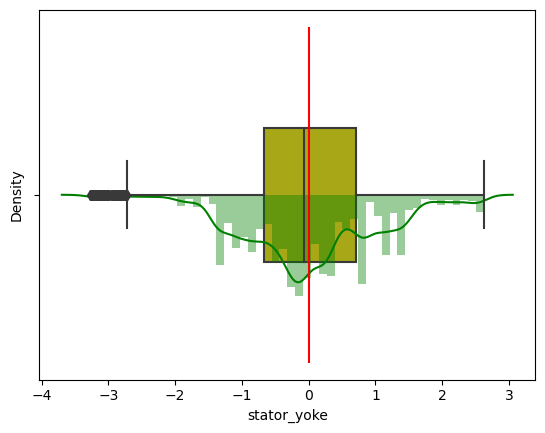

-0.013215648515104967


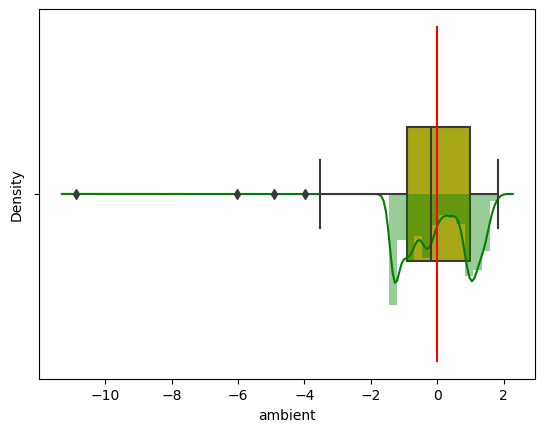

0.11796939026908806


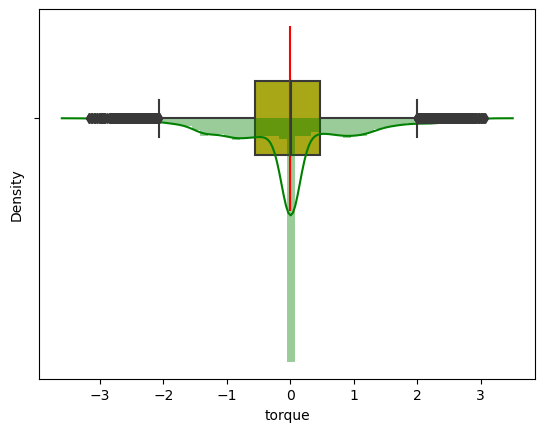

In [74]:
Xs = pd.DataFrame(X_train_scaled,columns=X.columns)
for i in Xs.columns:
    print(Xs[i].skew())
    sns.distplot(Xs[i],color='g')
    sns.boxplot(Xs[i],color = 'y')
    plt.vlines(Xs[i].mean(),ymin = -1,ymax = 1,color = 'r')
    plt.show()

Linear Regression

In [75]:
import statsmodels.api as sm
X_train_const = sm.add_constant(X_train_scaled)
lin_reg = sm.OLS(y_train,X_train_const).fit()
lin_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     pm   R-squared:                       0.764
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     4905.
Date:                Wed, 05 Oct 2022   Prob (F-statistic):               0.00
Time:                        16:35:02   Log-Likelihood:                -51760.
No. Observations:               16676   AIC:                         1.035e+05
Df Residuals:                   16664   BIC:                         1.036e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         66.6738      0.042   1596.172      0.000      66.592      66.756
x1            -0.0834      0.111     -0.748      0.454      -0.302       0.135
x2            -4.5608      0.159    -28.754      0.000      -4.872      -4.250
x3           -10.3514      0.308    -33.578      0.000     -10.956      -9.747
x4            -1.0128      0.102     -9.966      0.000      -1.212      -0.814
x5            21.1134      0.588     35.932      0.000      19.962      22.265
x6            -1.1464      0.166     -6.918      0.000      -1.471      -0.822
x7            -0.7025      0.112     -6.283      0.000      -0.922      -0.483
x8             0.0748      0.653      0.114      0.909      -1.206       1.356
x9            -2.0041      0.454     -4.418      0.000      -2.893      -1.115
x10            4.6640      0.050     93.747      0.000       4.566       4.762
x11           -0.5331      0.704     -0.758      0.449      -1.912       0.846
==============================================================================
Omnibus:                      447.477   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              517.570
Skew:                          -0.365   Prob(JB):                    4.08e-113
Kurtosis:                       3.461   Cond. No.                         44.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [84]:
from statsmodels.stats.diagnostic import linear_rainbow
linear_rainbow(lin_reg)

(1.0199009911929404, 0.18424176186346167)

In [83]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = [variance_inflation_factor(Xs.values,i) for i in range(Xs.shape[1])]
pd.DataFrame(vif,index=Xs.columns)

,0
u_q,7.118119
coolant,14.419477
stator_winding,54.468166
u_d,5.918928
stator_tooth,197.877849
motor_speed,15.739665
i_d,7.166080
i_q,244.724948
stator_yoke,117.911626
ambient,1.418585


In [71]:
knn = KNeighborsRegressor()
knn.fit(X_train_scaled,y_train)
y_pred = knn.predict(X_test_scaled)

0.9985736802293274


In [72]:
from sklearn.metrics import r2_score,mean_squared_error

In [93]:
print(mean_squared_error(y_test,y_pred))
print(r2_score(y_test,y_pred))

0.1752137246041001
0.9985736802293274


In [91]:
def tuning(X_train, y_train, model, parameters, metric):
    
    search = RandomizedSearchCV(estimator=model,
                                param_distributions=parameters,
                                scoring=metric,
                                #cv=StratifiedKFold(n_splits=10),
                                verbose=1,
                                n_iter=10,
                                random_state=10)
    search.fit(X_train, y_train)
    print('****************************************')
    print('Best Parameters')
    print(search.best_params_)
    print('****************************************')
    return (search.best_estimator_)

In [95]:
parameters = {
    'n_neighbors': range(1, 25),
    'metric': ['canberra', 'euclidean', 'minkowski'],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}
model = tuning(X_train_scaled, y_train, KNeighborsRegressor(), parameters, make_scorer(mean_squared_error))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
****************************************
Best Parameters
{'weights': 'distance', 'n_neighbors': 24, 'metric': 'canberra', 'algorithm': 'auto'}
****************************************


In [96]:
knn = KNeighborsRegressor(weights= 'distance', n_neighbors= 24, metric= 'canberra', algorithm= 'auto')
knn.fit(X_train_scaled,y_train)
y_pred = knn.predict(X_test_scaled)
print(mean_squared_error(y_test,y_pred))
print(r2_score(y_test,y_pred))

1.242108071548272
0.9898886727979535
